In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
from google.colab.patches import cv2_imshow

In [5]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

In [7]:
def solution(image_path_a, image_path_b):
  flash = cv2.imread(image_path_b)
  noflash = cv2.imread(image_path_a)
  flash = cv2.resize(flash, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_LINEAR)
  noflash = cv2.resize(noflash, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_LINEAR)

  if (flash.shape) != (noflash.shape):
      flash = cv2.resize(flash, (noflash.shape[1], noflash.shape[0]))

  intensity_layer_flash = cv2.cvtColor(flash, cv2.COLOR_BGR2GRAY)
  intensity_layer_noflash = cv2.cvtColor(noflash, cv2.COLOR_BGR2GRAY)

  intensity_layer_flash_f = intensity_layer_flash.astype(np.float32) / 255.0
  intensity_layer_noflash_f = intensity_layer_noflash.astype(np.float32) / 255.0

  color_layers = {
      'R': noflash[:, :, 2] / (intensity_layer_noflash_f+0.02),
      'G': noflash[:, :, 1] / (intensity_layer_noflash_f+0.02),
      'B': noflash[:, :, 0] / (intensity_layer_noflash_f+0.02)
  }

  def jointbilateralfilter(image, texture, sigma_s, sigma_r):
    r = int(np.ceil(3 * sigma_s))

    h, w = image.shape
    I = np.pad(image, ((r, r), (r, r)), 'symmetric').astype(np.float32)

    ht, wt = texture.shape
    T = np.pad(texture, ((r, r), (r, r)), 'symmetric').astype(np.int32)

    # Precomputing
    output = np.zeros_like(image)
    scaleFactor_s = 1 / (2 * sigma_s * sigma_s)
    scaleFactor_r = 1 / (2 * sigma_r * sigma_r)

    #kernal range
    LUT = np.exp(-np.arange(256) * np.arange(256) * scaleFactor_r)
    #spatial Gaussian function
    x, y = np.meshgrid(np.arange(2 * r + 1) - r, np.arange(2 * r + 1) - r)
    kernel_s = np.exp(-(x * x + y * y) * scaleFactor_s)

    for y in range(r, r + h):
        for x in range(r, r + w):
            wgt = LUT[np.abs(T[y - r:y + r + 1, x - r:x + r + 1] - T[y, x])] * kernel_s
            output[y - r, x - r] = np.sum(wgt * I[y - r:y + r + 1, x - r:x + r + 1]) / np.sum(wgt)
    return output
  sigma_s = 3
  if(flash.shape == (574, 782, 3) or flash.shape == (706, 774, 3)):
    sigma_s = 2
  bilateral_int_lay_nof = jointbilateralfilter(intensity_layer_noflash,intensity_layer_flash,sigma_s,5)
  bilateral_int_lay_f = jointbilateralfilter(intensity_layer_flash,intensity_layer_noflash,sigma_s,5)
  bilateral_int_lay_f_float = bilateral_int_lay_f.astype(np.float32) / 255.0
  bilateral_int_lay_nof_float = bilateral_int_lay_nof.astype(np.float32) / 255.0

  details_flash = (intensity_layer_flash_f+0.02)/(bilateral_int_lay_f_float+0.02)
  int_values = bilateral_int_lay_nof_float*details_flash

  color_b = color_layers['B']*int_values
  color_g = color_layers['G']*int_values
  color_r = color_layers['R']*int_values

  final_image = np.dstack((color_b, color_g, color_r))
  final_image = np.clip(final_image, 0, 255).astype(np.uint8)
  final_image = cv2.resize(final_image, None, fx=2, fy=2, interpolation=cv2.INTER_LINEAR)

  return final_image

In [31]:
noflash = '/content/drive/My Drive/Assignment-2(1)/Q2/ultimate_test/2_a.jpg'
flash = '/content/drive/My Drive/Assignment-2(1)/Q2/ultimate_test/2_b.jpg'

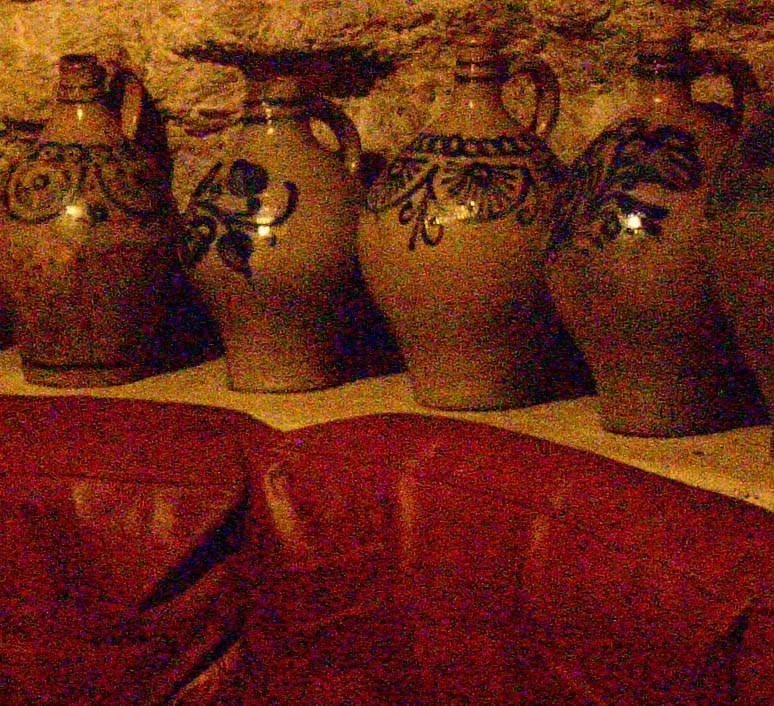

In [32]:
cv2_imshow(cv2.imread(noflash))

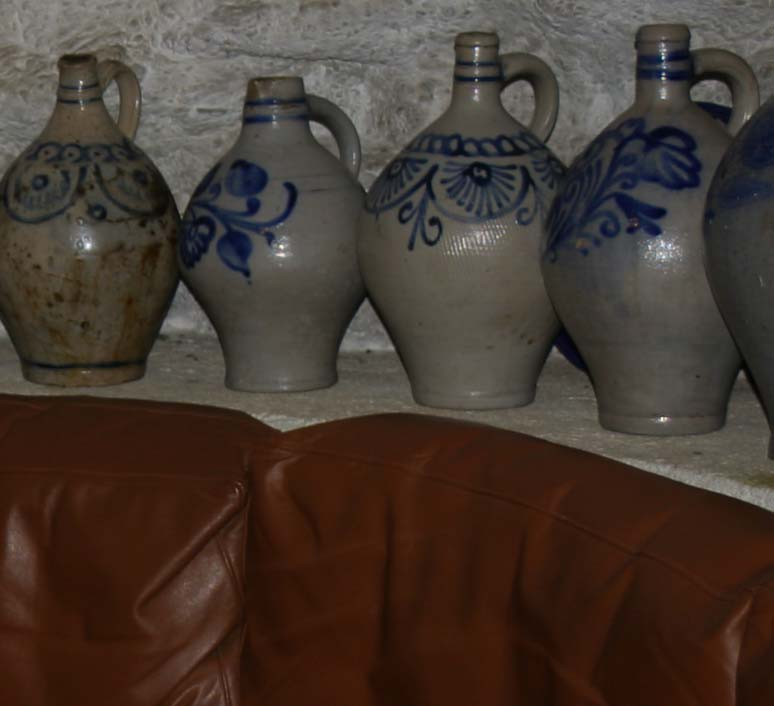

In [33]:
cv2_imshow(cv2.imread(flash))

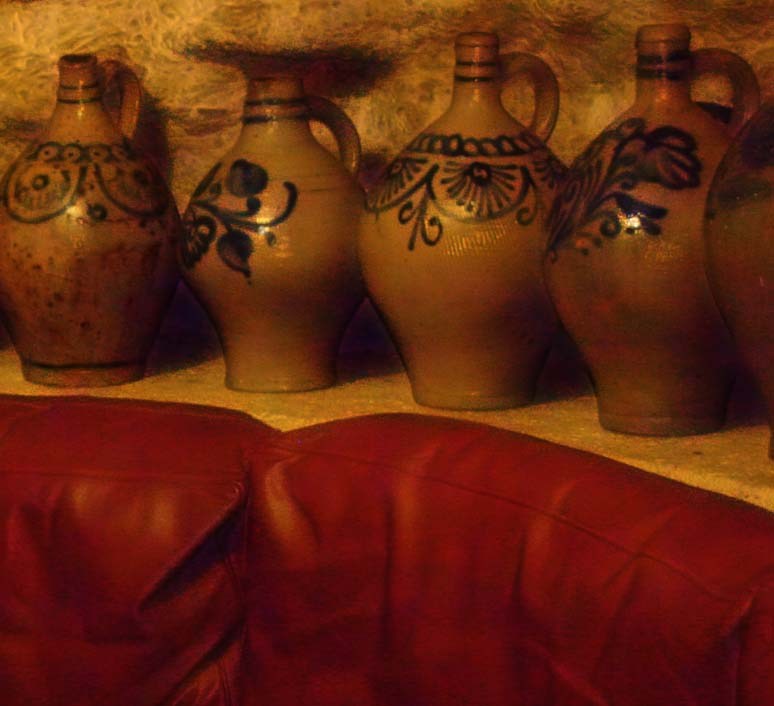

In [34]:
cv2_imshow(solution(noflash,flash))

In [35]:
import time
start = time.time()
solution(noflash,flash)
end = time.time()
print(end-start)

8.25147294998169


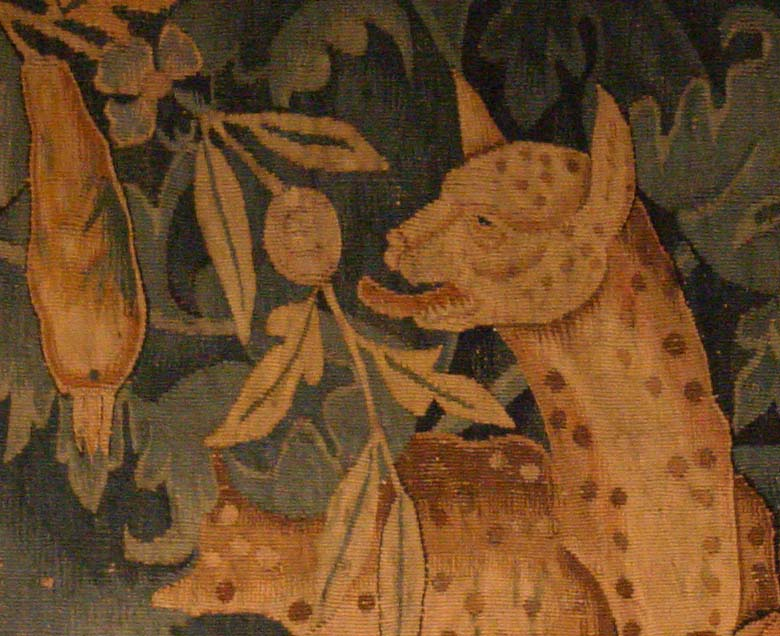

In [37]:
noflash = '/content/drive/My Drive/Assignment-2(1)/Q2/ultimate_test/1_a.jpg'
flash = '/content/drive/My Drive/Assignment-2(1)/Q2/ultimate_test/1_b.jpg'
cv2_imshow(cv2.imread(noflash))

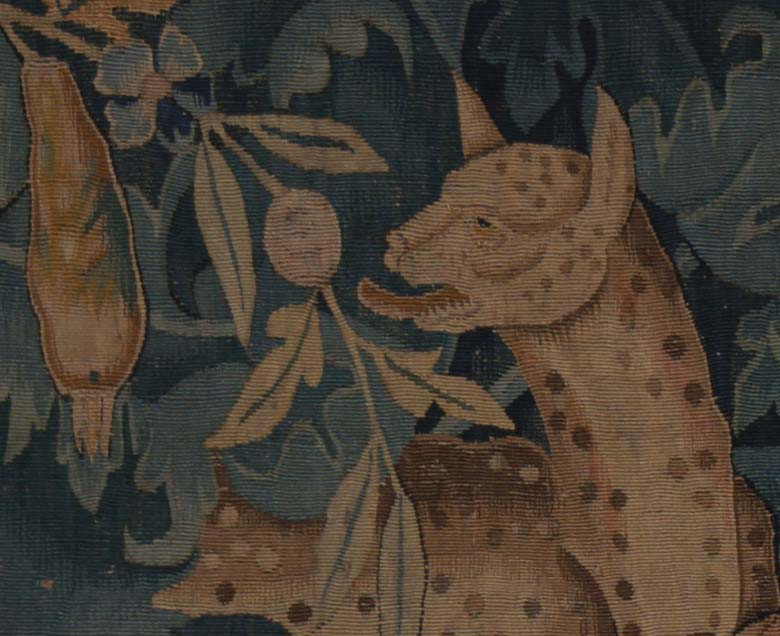

In [38]:
cv2_imshow(cv2.imread(flash))

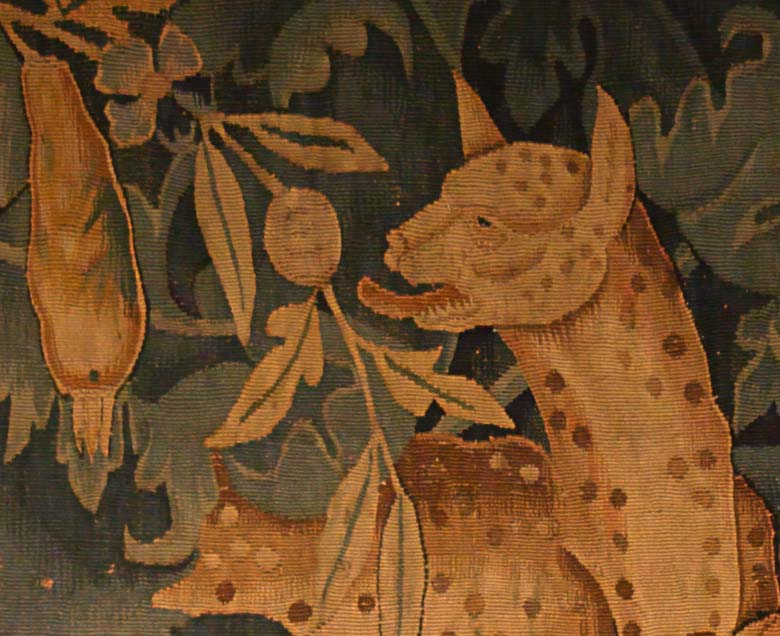

In [40]:
cv2_imshow(solution(noflash,flash))

In [41]:
import time
start = time.time()
solution(noflash,flash)
end = time.time()
print(end-start)

8.111397981643677


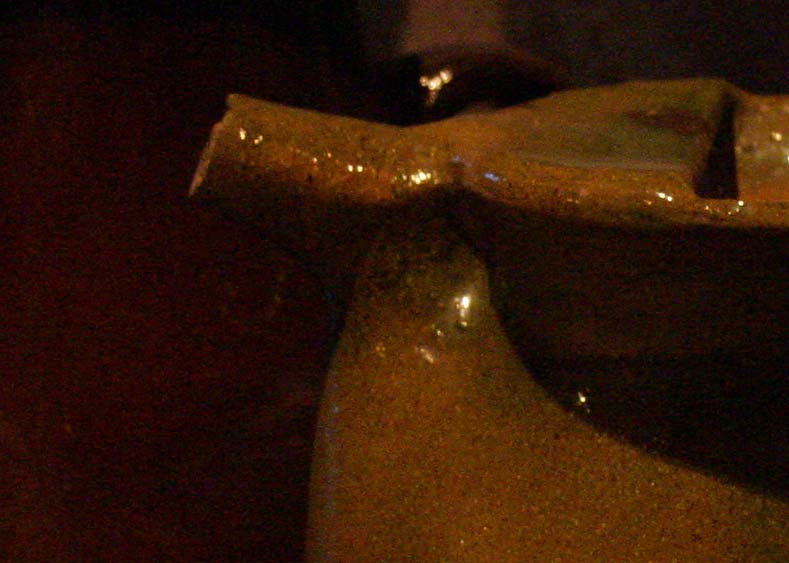

In [42]:
noflash = '/content/drive/My Drive/Assignment-2(1)/Q2/ultimate_test/3_a.jpg'
flash = '/content/drive/My Drive/Assignment-2(1)/Q2/ultimate_test/3_b.jpg'
cv2_imshow(cv2.imread(noflash))

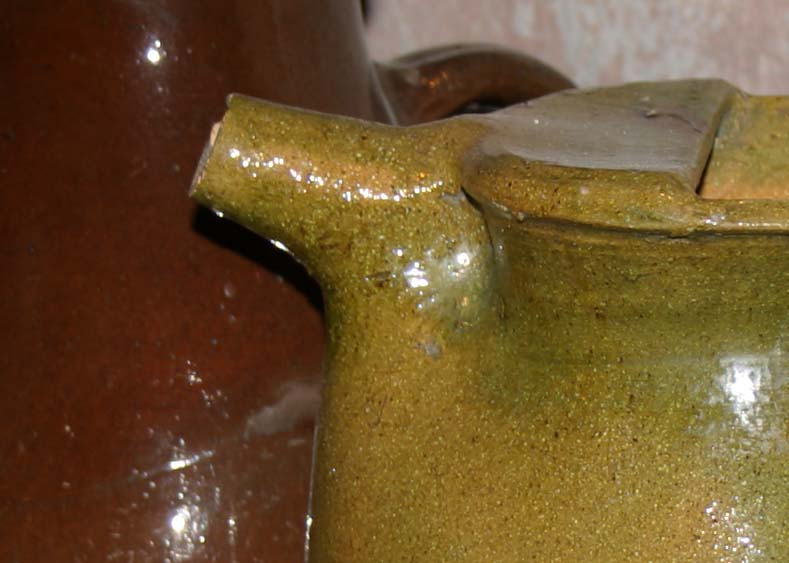

In [43]:
cv2_imshow(cv2.imread(flash))

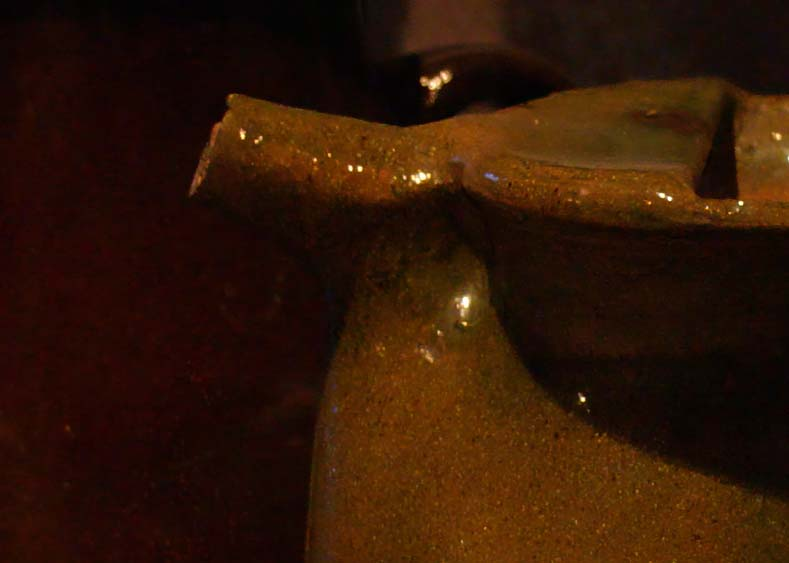

In [44]:
cv2_imshow(solution(noflash,flash))

In [45]:
import time
start = time.time()
solution(noflash,flash)
end = time.time()
print(end-start)

6.9901649951934814


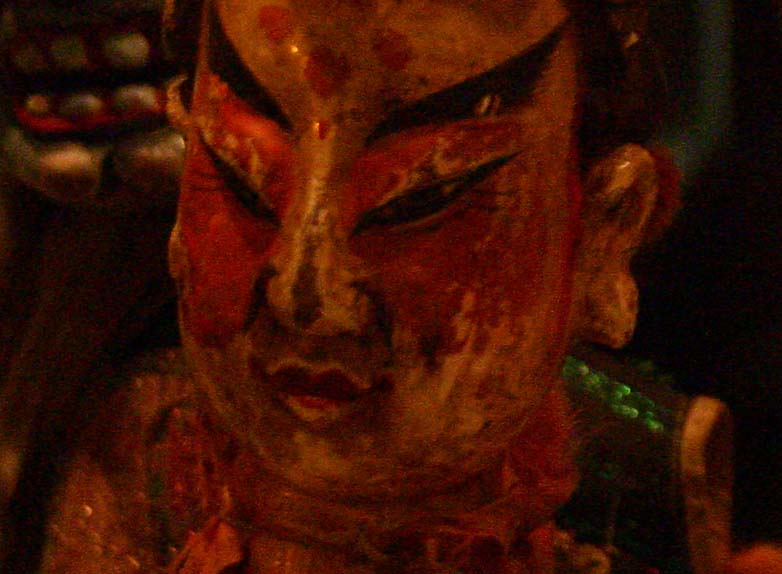

In [46]:
noflash = '/content/drive/My Drive/Assignment-2(1)/Q2/ultimate_test/4_a.jpg'
flash = '/content/drive/My Drive/Assignment-2(1)/Q2/ultimate_test/4_b.jpg'
cv2_imshow(cv2.imread(noflash))

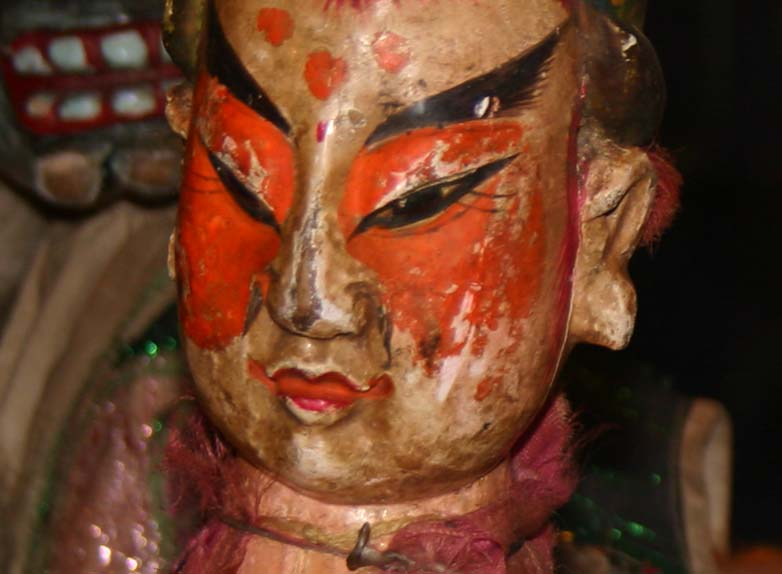

In [47]:
cv2_imshow(cv2.imread(flash))

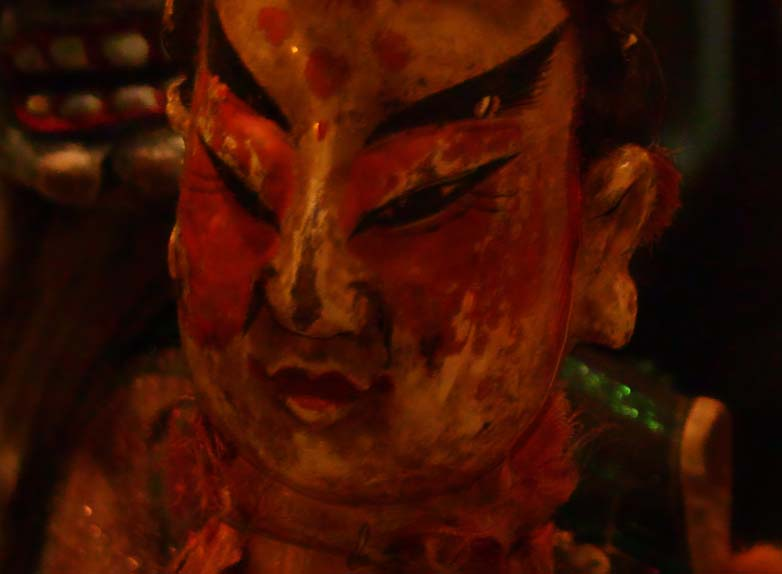

In [48]:
cv2_imshow(solution(noflash,flash))

In [49]:
import time
start = time.time()
solution(noflash,flash)
end = time.time()
print(end-start)

6.805373430252075


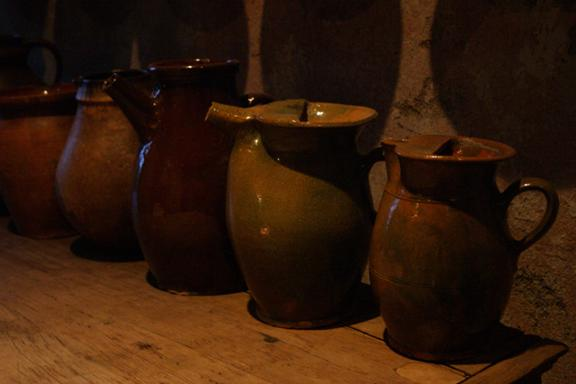

In [53]:
noflash = '/content/drive/My Drive/Assignment-2/Q2/ultimate_test/2_a.jpg'
flash = '/content/drive/My Drive/Assignment-2/Q2/ultimate_test/2_b.jpg'
cv2_imshow(cv2.imread(noflash))

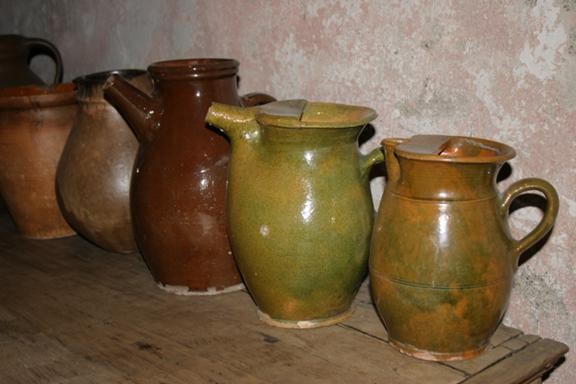

In [54]:
cv2_imshow(cv2.imread(flash))

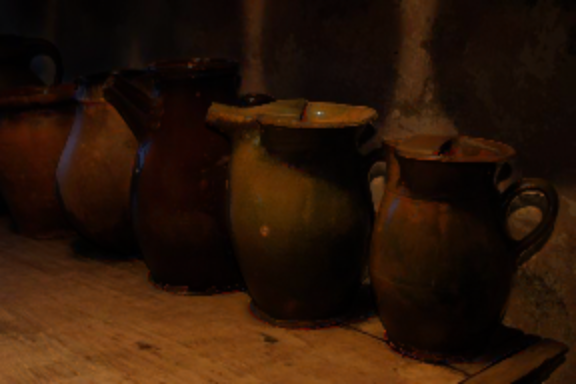

In [56]:
cv2_imshow(solution(noflash,flash))

In [57]:
import time
start = time.time()
solution(noflash,flash)
end = time.time()
print(end-start)

3.7194976806640625
